In [0]:
%matplotlib inline

# install pillow
!pip uninstall -y Pillow
!pip install Pillow==4.1.1

# download and unzip dataset o train
!wget http://images.cocodataset.org/zips/train2014.zip
!mkdir train
%cd /content/train
!unzip -qq /content/train2014.zip
%cd ..

#download model
!wget https://web.eecs.umich.edu/~justincj/models/vgg16-00b39a1b.pth
  
# download helper code
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/transformer.py
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/experimental.py
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/utils.py
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/vgg.py

# download style image  
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/images/mosaic.jpg

In [0]:
import PIL
from PIL import Image
import matplotlib.pyplot as plt
import os
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
import random
import numpy as np
import time
import vgg
import transformer
import experimental
import utils

In [0]:
# GLOBAL SETTINGS
TRAIN_IMAGE_SIZE = 256
DATASET_PATH = "/content/train"
NUM_EPOCHS = 1
STYLE_IMAGE_PATH = "/content/mosaic.jpg"
BATCH_SIZE = 4 
CONTENT_WEIGHT = 17
STYLE_WEIGHT = 50
TV_WEIGHT = 1e-6 
ADAM_LR = 0.001
SAVE_MODEL_PATH = "/content/"
SAVE_IMAGE_PATH = "/content/"
SAVE_MODEL_EVERY = 500 # 2,000 Images with batch size 4
SEED = 35

========Epoch 1/2========
========Iteration 1/20696========
	Content Loss:	3626102.00
	Style Loss:	201332736.00
	Total Loss:	204958832.00
Time elapsed:	0.47474026679992676 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_0.pth


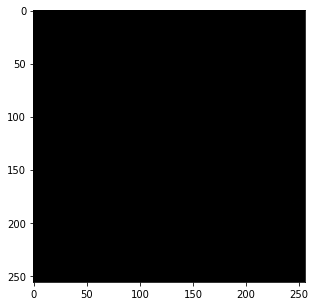

Saved sample tranformed image at /content/sample0_0.png
========Iteration 501/20696========
	Content Loss:	8400345.00
	Style Loss:	53591596.00
	Total Loss:	61991877.89
Time elapsed:	132.6645312309265 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_500.pth


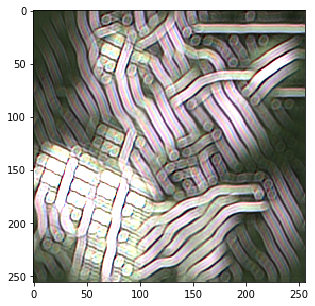

Saved sample tranformed image at /content/sample0_500.png
========Iteration 1001/20696========
	Content Loss:	9189360.00
	Style Loss:	30215616.00
	Total Loss:	39404954.15
Time elapsed:	264.47220492362976 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_1000.pth


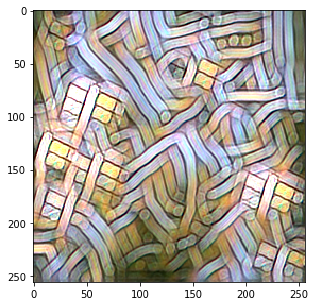

Saved sample tranformed image at /content/sample0_1000.png
========Iteration 1501/20696========
	Content Loss:	9331642.00
	Style Loss:	21491852.00
	Total Loss:	30823475.09
Time elapsed:	396.0578598976135 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_1500.pth


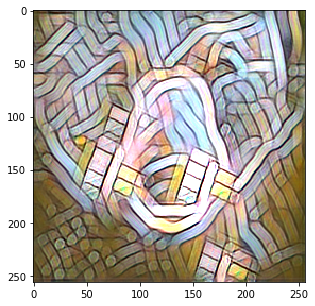

Saved sample tranformed image at /content/sample0_1500.png
========Iteration 2001/20696========
	Content Loss:	9279210.00
	Style Loss:	16929028.00
	Total Loss:	26208218.35
Time elapsed:	527.830974817276 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_2000.pth


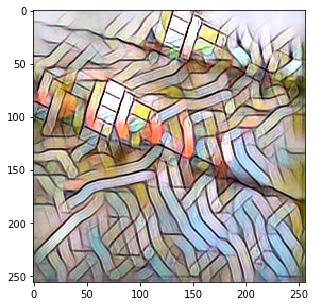

Saved sample tranformed image at /content/sample0_2000.png
========Iteration 2501/20696========
	Content Loss:	9148540.00
	Style Loss:	14086735.00
	Total Loss:	23235265.79
Time elapsed:	660.1649820804596 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_2500.pth


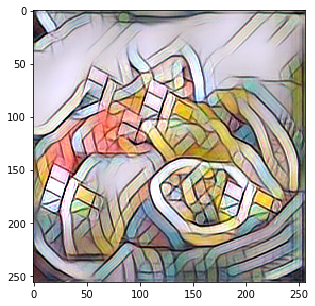

Saved sample tranformed image at /content/sample0_2500.png
========Iteration 3001/20696========
	Content Loss:	8996342.00
	Style Loss:	12135833.00
	Total Loss:	21132155.87
Time elapsed:	792.3038597106934 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_3000.pth


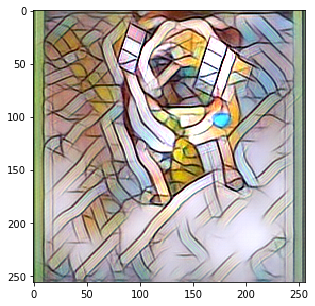

Saved sample tranformed image at /content/sample0_3000.png
========Iteration 3501/20696========
	Content Loss:	8834249.00
	Style Loss:	10721133.00
	Total Loss:	19555369.10
Time elapsed:	924.4115362167358 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_3500.pth


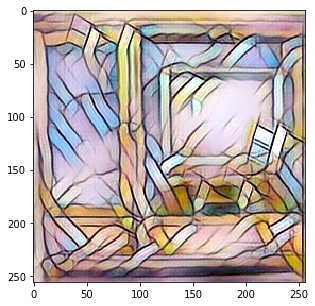

Saved sample tranformed image at /content/sample0_3500.png
========Iteration 4001/20696========
	Content Loss:	8710002.00
	Style Loss:	9649811.00
	Total Loss:	18359793.79
Time elapsed:	1056.1992602348328 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_4000.pth


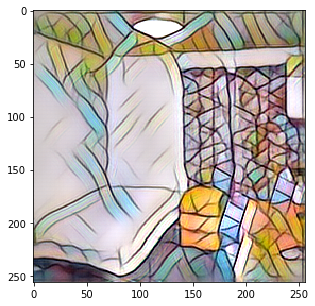

Saved sample tranformed image at /content/sample0_4000.png
========Iteration 4501/20696========
	Content Loss:	8572537.00
	Style Loss:	8787741.00
	Total Loss:	17360264.19
Time elapsed:	1187.8169429302216 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_4500.pth


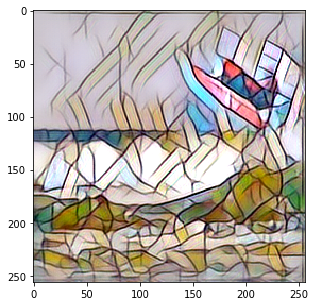

Saved sample tranformed image at /content/sample0_4500.png
========Iteration 5001/20696========
	Content Loss:	8439842.00
	Style Loss:	8090826.00
	Total Loss:	16530655.46
Time elapsed:	1319.4206538200378 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_5000.pth


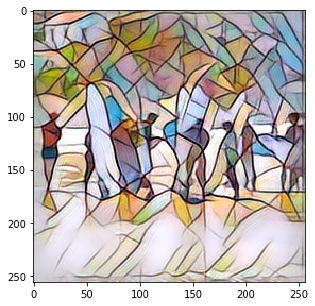

Saved sample tranformed image at /content/sample0_5000.png
========Iteration 5501/20696========
	Content Loss:	8316184.50
	Style Loss:	7515816.00
	Total Loss:	15831992.51
Time elapsed:	1451.074879169464 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_5500.pth


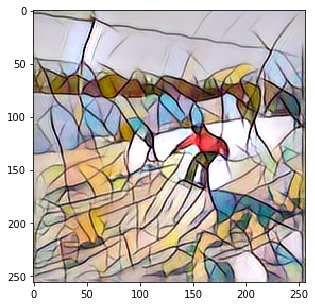

Saved sample tranformed image at /content/sample0_5500.png
========Iteration 6001/20696========
	Content Loss:	8203715.50
	Style Loss:	7030549.00
	Total Loss:	15234258.45
Time elapsed:	1582.661538362503 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_6000.pth


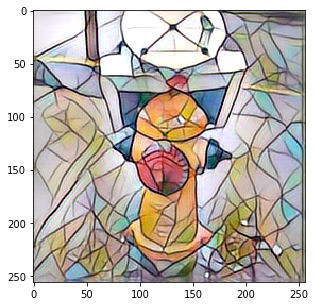

Saved sample tranformed image at /content/sample0_6000.png
========Iteration 6501/20696========
	Content Loss:	8100771.00
	Style Loss:	6615208.50
	Total Loss:	14715969.78
Time elapsed:	1714.4318628311157 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_6500.pth


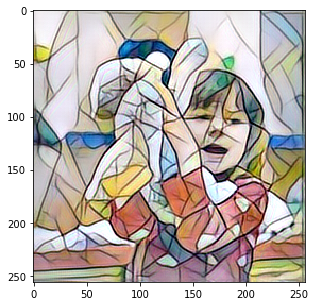

Saved sample tranformed image at /content/sample0_6500.png
========Iteration 7001/20696========
	Content Loss:	8006919.50
	Style Loss:	6258010.50
	Total Loss:	14264920.42
Time elapsed:	1846.0407214164734 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_7000.pth


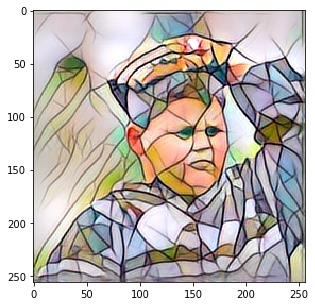

Saved sample tranformed image at /content/sample0_7000.png
========Iteration 7501/20696========
	Content Loss:	7921488.50
	Style Loss:	5947687.50
	Total Loss:	13869168.77
Time elapsed:	1978.0030086040497 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_7500.pth


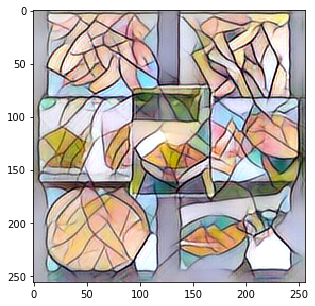

Saved sample tranformed image at /content/sample0_7500.png
========Iteration 8001/20696========
	Content Loss:	7845908.00
	Style Loss:	5673545.00
	Total Loss:	13519442.74
Time elapsed:	2109.5494725704193 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_8000.pth


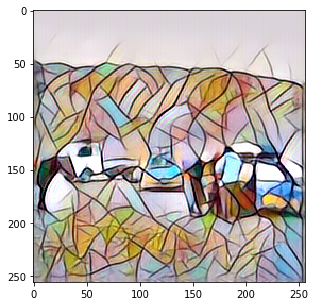

Saved sample tranformed image at /content/sample0_8000.png
========Iteration 8501/20696========
	Content Loss:	7777235.50
	Style Loss:	5430358.50
	Total Loss:	13207583.33
Time elapsed:	2241.1052124500275 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_8500.pth


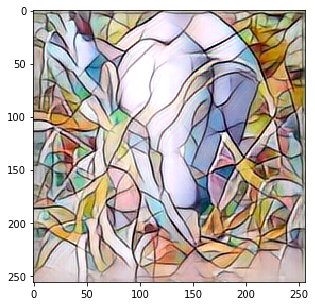

Saved sample tranformed image at /content/sample0_8500.png
========Iteration 9001/20696========
	Content Loss:	7714467.50
	Style Loss:	5214229.50
	Total Loss:	12928684.36
Time elapsed:	2372.566605567932 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_9000.pth


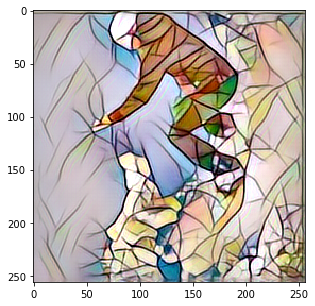

Saved sample tranformed image at /content/sample0_9000.png
========Iteration 9501/20696========
	Content Loss:	7658523.50
	Style Loss:	5019442.50
	Total Loss:	12677951.99
Time elapsed:	2504.0120000839233 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_9500.pth


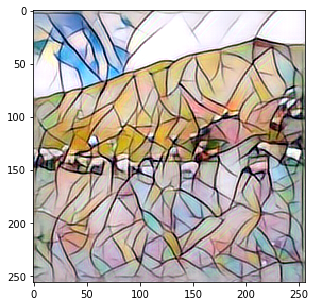

Saved sample tranformed image at /content/sample0_9500.png
========Iteration 10001/20696========
	Content Loss:	7606179.00
	Style Loss:	4842508.50
	Total Loss:	12448683.19
Time elapsed:	2635.5886867046356 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_10000.pth


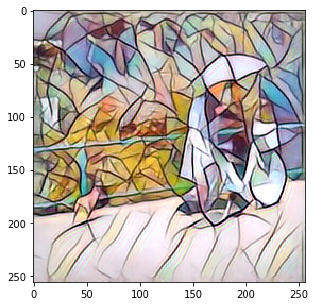

Saved sample tranformed image at /content/sample0_10000.png
========Iteration 10501/20696========
	Content Loss:	7557290.00
	Style Loss:	4681842.50
	Total Loss:	12239127.13
Time elapsed:	2767.1238584518433 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_10500.pth


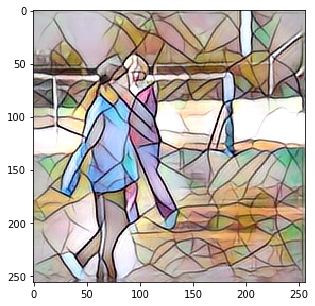

Saved sample tranformed image at /content/sample0_10500.png
========Iteration 11001/20696========
	Content Loss:	7512057.50
	Style Loss:	4534960.00
	Total Loss:	12047008.98
Time elapsed:	2898.811666250229 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_11000.pth


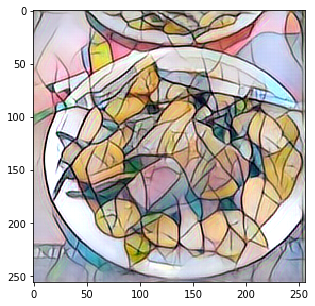

Saved sample tranformed image at /content/sample0_11000.png
========Iteration 11501/20696========
	Content Loss:	7469623.00
	Style Loss:	4400239.50
	Total Loss:	11869857.21
Time elapsed:	3030.402045726776 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_11500.pth


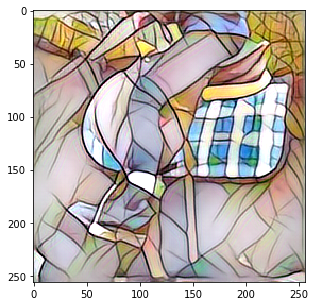

Saved sample tranformed image at /content/sample0_11500.png
========Iteration 12001/20696========
	Content Loss:	7427990.50
	Style Loss:	4276424.00
	Total Loss:	11704410.29
Time elapsed:	3161.964697122574 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_12000.pth


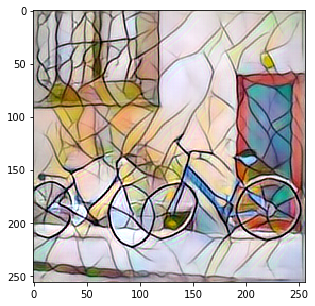

Saved sample tranformed image at /content/sample0_12000.png
========Iteration 12501/20696========
	Content Loss:	7390736.00
	Style Loss:	4162273.75
	Total Loss:	11553001.99
Time elapsed:	3293.4514257907867 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_12500.pth


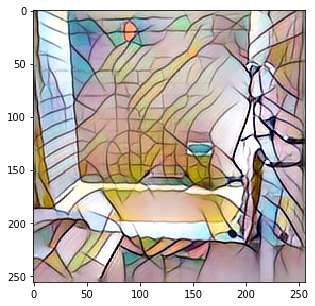

Saved sample tranformed image at /content/sample0_12500.png
========Iteration 13001/20696========
	Content Loss:	7356928.50
	Style Loss:	4056217.75
	Total Loss:	11413134.37
Time elapsed:	3425.1108345985413 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_13000.pth


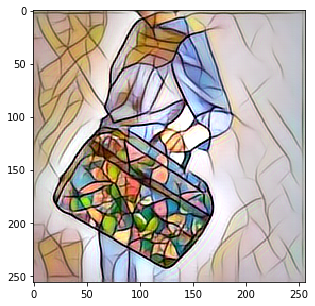

Saved sample tranformed image at /content/sample0_13000.png
========Iteration 13501/20696========
	Content Loss:	7324763.00
	Style Loss:	3958005.00
	Total Loss:	11282762.72
Time elapsed:	3556.668487071991 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_13500.pth


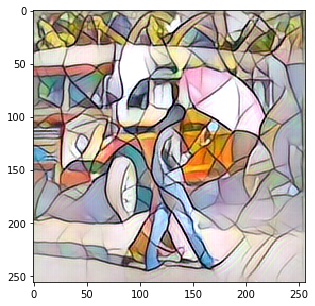

Saved sample tranformed image at /content/sample0_13500.png
========Iteration 14001/20696========
	Content Loss:	7294650.00
	Style Loss:	3866460.50
	Total Loss:	11161103.76
Time elapsed:	3688.2218239307404 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_14000.pth


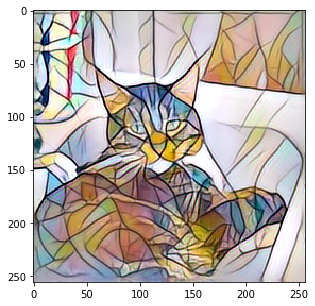

Saved sample tranformed image at /content/sample0_14000.png
========Iteration 14501/20696========
	Content Loss:	7263913.50
	Style Loss:	3781143.00
	Total Loss:	11045046.39
Time elapsed:	3819.9177753925323 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_14500.pth


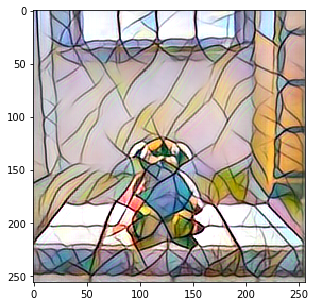

Saved sample tranformed image at /content/sample0_14500.png
========Iteration 15001/20696========
	Content Loss:	7235748.00
	Style Loss:	3700679.75
	Total Loss:	10936416.53
Time elapsed:	3951.6160519123077 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_15000.pth


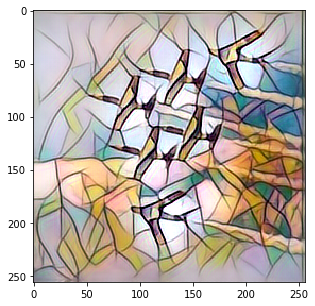

Saved sample tranformed image at /content/sample0_15000.png
========Iteration 15501/20696========
	Content Loss:	7209132.00
	Style Loss:	3625460.00
	Total Loss:	10834579.01
Time elapsed:	4083.178853750229 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_15500.pth


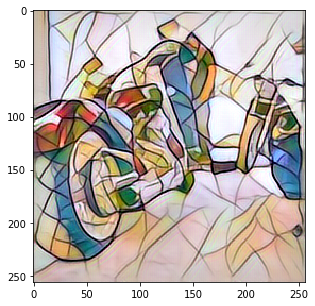

Saved sample tranformed image at /content/sample0_15500.png
========Iteration 16001/20696========
	Content Loss:	7183703.50
	Style Loss:	3554771.00
	Total Loss:	10738465.61
Time elapsed:	4214.819255113602 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_16000.pth


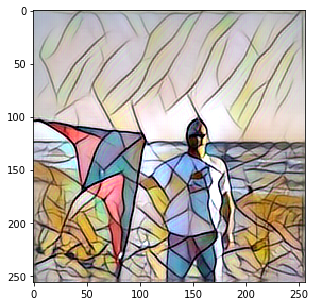

Saved sample tranformed image at /content/sample0_16000.png
========Iteration 16501/20696========
	Content Loss:	7160068.00
	Style Loss:	3487933.75
	Total Loss:	10647996.29
Time elapsed:	4346.589579582214 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_16500.pth


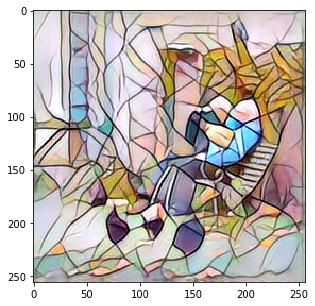

Saved sample tranformed image at /content/sample0_16500.png
========Iteration 17001/20696========
	Content Loss:	7137433.50
	Style Loss:	3424781.75
	Total Loss:	10562203.94
Time elapsed:	4478.138843536377 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_17000.pth


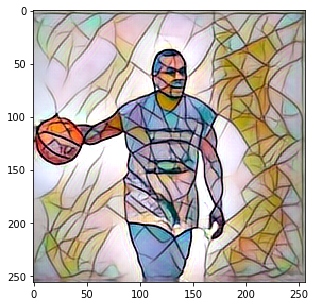

Saved sample tranformed image at /content/sample0_17000.png
========Iteration 17501/20696========
	Content Loss:	7116568.50
	Style Loss:	3365561.50
	Total Loss:	10482123.32
Time elapsed:	4609.68021607399 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_17500.pth


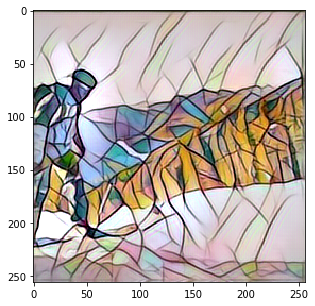

Saved sample tranformed image at /content/sample0_17500.png
========Iteration 18001/20696========
	Content Loss:	7095272.50
	Style Loss:	3308888.25
	Total Loss:	10404151.61
Time elapsed:	4741.270346879959 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_18000.pth


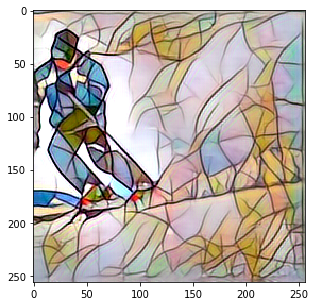

Saved sample tranformed image at /content/sample0_18000.png
========Iteration 18501/20696========
	Content Loss:	7074747.50
	Style Loss:	3255552.50
	Total Loss:	10330292.30
Time elapsed:	4873.091240167618 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_18500.pth


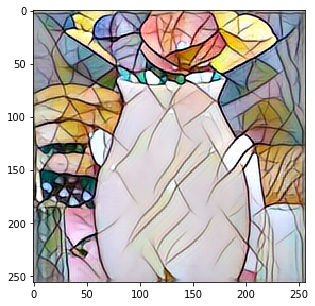

Saved sample tranformed image at /content/sample0_18500.png
========Iteration 19001/20696========
	Content Loss:	7055367.50
	Style Loss:	3204677.25
	Total Loss:	10260039.83
Time elapsed:	5004.778289556503 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_19000.pth


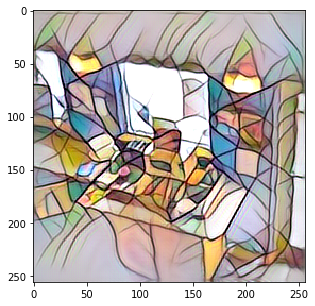

Saved sample tranformed image at /content/sample0_19000.png
========Iteration 19501/20696========
	Content Loss:	7037324.00
	Style Loss:	3156358.50
	Total Loss:	10193677.96
Time elapsed:	5136.430897474289 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_19500.pth


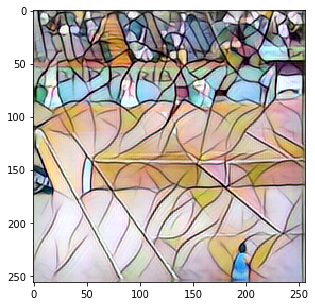

Saved sample tranformed image at /content/sample0_19500.png
========Iteration 20001/20696========
	Content Loss:	7019854.50
	Style Loss:	3110374.00
	Total Loss:	10130230.21
Time elapsed:	5268.094390153885 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_20000.pth


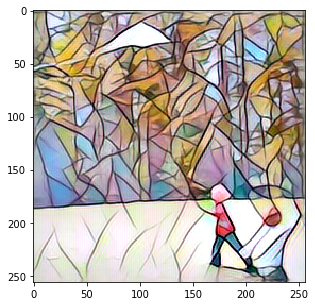

Saved sample tranformed image at /content/sample0_20000.png
========Iteration 20501/20696========
	Content Loss:	7002226.00
	Style Loss:	3066575.50
	Total Loss:	10068814.19
Time elapsed:	5399.698086738586 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_20500.pth


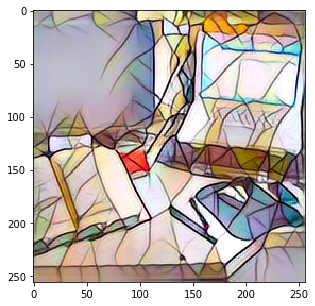

Saved sample tranformed image at /content/sample0_20500.png
========Iteration 20696/20696========
	Content Loss:	6995756.50
	Style Loss:	3050220.75
	Total Loss:	10045986.06
Time elapsed:	5451.295463562012 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_20695.pth


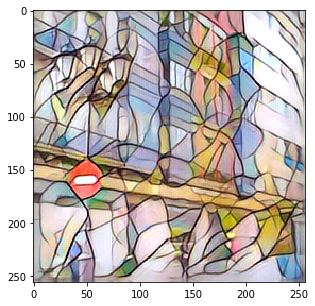

Saved sample tranformed image at /content/sample0_20695.png
Done Training the Transformer Network!
Training Time: 5451.551099061966 seconds
========Content Loss========
[204958832.0, 61991877.88822355, 39404954.14885115, 30823475.08994004, 26208218.35032484, 23235265.794082366, 21132155.872709095, 19555369.104255926, 18359793.793301675, 17360264.191290826, 16530655.456408719, 15831992.511179786, 15234258.447425429, 14715969.781648977, 14264920.418940151, 13869168.765097987, 13519442.736032996, 13207583.33413716, 12928684.361070992, 12677951.987738132, 12448683.194530547, 12239127.126892677, 12047008.98363785, 11869857.213633597, 11704410.294933755, 11553001.991840653, 11413134.372779017, 11282762.719428191, 11161103.763052639, 11045046.388731811, 10936416.525598293, 10834579.009031676, 10738465.608586963, 10647996.289285498, 10562203.937297806, 10482123.32201017, 10404151.611493805, 10330292.296794768, 10260039.826061787, 10193677.957284242, 10130230.213914305, 10068814.186527487, 1004

In [6]:
def train():
    # Seeds
    torch.manual_seed(SEED)
    torch.cuda.manual_seed(SEED)
    np.random.seed(SEED)
    random.seed(SEED)

    # Device
    device = ("cuda" if torch.cuda.is_available() else "cpu")

    # Dataset and Dataloader
    transform = transforms.Compose([
        transforms.Resize(TRAIN_IMAGE_SIZE),
        transforms.CenterCrop(TRAIN_IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.mul(255))
    ])
    train_dataset = datasets.ImageFolder(DATASET_PATH, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

    # Load networks
    #TransformerNetwork = transformer.TransformerNetwork().to(device)
    TransformerNetwork = experimental.TransformerNetworkV2().to(device)
    VGG = vgg.VGG16('/content/vgg16-00b39a1b.pth').to(device)

    # Get Style Features
    imagenet_neg_mean = torch.tensor([-103.939, -116.779, -123.68], dtype=torch.float32).reshape(1,3,1,1).to(device)
    imagenet_mean = torch.tensor([103.939, 116.779, 123.68], dtype=torch.float32).reshape(1,3,1,1).to(device)
    style_image = utils.load_image(STYLE_IMAGE_PATH)
    style_tensor = utils.itot(style_image).to(device)
    style_tensor = style_tensor.add(imagenet_neg_mean)
    B, C, H, W = style_tensor.shape
    style_features = VGG(style_tensor.expand([BATCH_SIZE, C, H, W]))
    style_gram = {}
    for key, value in style_features.items():
        style_gram[key] = utils.gram(value)

    # Optimizer settings
    optimizer = optim.Adam(TransformerNetwork.parameters(), lr=ADAM_LR)

    # Loss trackers
    content_loss_history = []
    style_loss_history = []
    total_loss_history = []
    batch_content_loss_sum = 0
    batch_style_loss_sum = 0
    batch_total_loss_sum = 0

    # Optimization/Training Loop
    batch_count = 1
    start_time = time.time()
    for epoch in range (1, NUM_EPOCHS+1):
        print("========Epoch {}/{}========".format(epoch, NUM_EPOCHS+1))
        for batch_id, (content_batch, _) in enumerate(train_loader):
            # Current Batch size in case of odd batches
            curr_batch_size = content_batch.shape[0]
            
            # Zero-out Gradients
            optimizer.zero_grad()

            # Generate images and get features
            content_batch = content_batch[:,[2,1,0]].to(device)
            generated_batch = TransformerNetwork(content_batch)
            content_features = VGG(content_batch.add(imagenet_neg_mean))
            generated_features = VGG(generated_batch.add(imagenet_neg_mean))

            # Content Loss
            MSELoss = nn.MSELoss().to(device)
            content_loss = CONTENT_WEIGHT * MSELoss(content_features['relu2_2'], generated_features['relu2_2'])            
            batch_content_loss_sum += content_loss

            # Style Loss
            style_loss = 0
            for key, value in generated_features.items():
                s_loss = MSELoss(utils.gram(value), style_gram[key][:curr_batch_size])
                style_loss += s_loss
            style_loss *= STYLE_WEIGHT
            batch_style_loss_sum += style_loss

            # Total Loss
            total_loss = content_loss + style_loss
            batch_total_loss_sum += total_loss.item()

            # Backprop and Weight Update
            total_loss.backward()
            optimizer.step()

            # Save Model and Print Losses
            if (((batch_count-1)%SAVE_MODEL_EVERY == 0) or (batch_count==NUM_EPOCHS*len(train_loader))):
                # Print Losses
                print("========Iteration {}/{}========".format(batch_count, NUM_EPOCHS*len(train_loader)))
                print("\tContent Loss:\t{:.2f}".format(batch_content_loss_sum/batch_count))
                print("\tStyle Loss:\t{:.2f}".format(batch_style_loss_sum/batch_count))
                print("\tTotal Loss:\t{:.2f}".format(batch_total_loss_sum/batch_count))
                print("Time elapsed:\t{} seconds".format(time.time()-start_time))

                # Save Model
                checkpoint_path = SAVE_MODEL_PATH + "checkpoint_" + str(batch_count-1) + ".pth"
                torch.save(TransformerNetwork.state_dict(), checkpoint_path)
                print("Saved TransformerNetwork checkpoint file at {}".format(checkpoint_path))

                # Save sample generated image
                sample_tensor = generated_batch[0].clone().detach().unsqueeze(dim=0)
                sample_image = utils.ttoi(sample_tensor.clone().detach())
                sample_image_path = SAVE_IMAGE_PATH + "sample0_" + str(batch_count-1) + ".png"
                utils.saveimg(sample_image, sample_image_path)
                utils.show(sample_image)
                print("Saved sample tranformed image at {}".format(sample_image_path))

                # Save loss histories
                content_loss_history.append(batch_total_loss_sum/batch_count)
                style_loss_history.append(batch_style_loss_sum/batch_count)
                total_loss_history.append(batch_total_loss_sum/batch_count)

            # Iterate Batch Counter
            batch_count+=1

    stop_time = time.time()
    # Print loss histories
    print("Done Training the Transformer Network!")
    print("Training Time: {} seconds".format(stop_time-start_time))
    print("========Content Loss========")
    print(content_loss_history) 
    print("========Style Loss========")
    print(style_loss_history) 
    print("========Total Loss========")
    print(total_loss_history) 

    # Save TransformerNetwork weights
    TransformerNetwork.eval()
    TransformerNetwork.cpu()
    final_path = SAVE_MODEL_PATH + "transformer_weight.pth"
    print("Saving TransformerNetwork weights at {}".format(final_path))
    torch.save(TransformerNetwork.state_dict(), final_path)
    print("Done saving final model")

train()